### Feature Explanation

The following features were selected to build the model for predicting fight outcomes. These features represent the key characteristics of the fighters and their statistics. Below is a detailed explanation of each feature and its importance:

1. **Fighter Age (`r_age`, `b_age`)**: 
   - The age of a fighter can influence physical fitness, endurance, and overall experience.
   - The age difference (`age_diff`) is also a potential indicator of one fighter's advantage over the other.

2. **Height and Weight (`r_height`, `b_height`, `r_weight`, `b_weight`)**: 
   - Physical attributes impact a fighter's ability to control distance and the power of their strikes.

3. **Reach (`r_reach`, `b_reach`)**:
   - A greater reach advantage allows fighters to control their opponent and strike from a safe distance.

4. **Total Wins and Losses (`r_wins_total`, `b_wins_total`, `r_losses_total`, `b_losses_total`)**:
   - These statistics reflect the overall experience and success rate of the fighters throughout their careers.

5. **Striking Statistics (`r_SLpM_total`, `b_SLpM_total`, `r_SApM_total`, `b_SApM_total`)**:
   - **SLpM** (Significant Strikes Landed per Minute) indicates a fighter's activity level.
   - **SApM** (Significant Strikes Absorbed per Minute) reflects a fighter's defensive capabilities.

6. **Significant Strike Accuracy (`r_sig_str_acc_total`, `b_sig_str_acc_total`)**:
   - Strike accuracy represents how effective fighters are at landing meaningful strikes.

7. **Takedown Accuracy and Defense (`r_td_acc_total`, `b_td_acc_total`, `r_td_def_total`, `b_td_def_total`)**:
   - Takedowns and takedown defense are crucial in mixed martial arts, especially for fighters who rely on grappling.

8. **Submission Attempts (`r_sub_avg`, `b_sub_avg`)**:
   - This metric measures how active a fighter is in attempting submissions, indicating their grappling skill set.

9. **Takedown and Strike Defense Statistics (`r_td_avg`, `b_td_avg`, `r_str_def_total`, `b_str_def_total`)**:
   - These additional metrics, such as average takedowns and strike defense, provide a more comprehensive view of each fighter's skill set.

10. **Total Wins Difference (`wins_total_diff`)**:
    - Indicates the difference in experience levels between the fighters, which can be a key factor in predictions.

11. **Age Difference (`age_diff`)**:
    - Helps account for the potential advantage or disadvantage related to age.

These features were chosen because they represent critical aspects of a fighter's physical, technical, and performance characteristics, providing a well-rounded dataset for accurate predictions.


In [1]:
import os
import pandas as pd
from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image
from sklearn.impute import SimpleImputer  
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
from sklearn.utils.validation import check_is_fitted
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report,confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# Load the dataset (ensure the file path is correct)
ufc_data_cleaned = pd.read_csv('../data/processed/ufc_data_final.csv')

# Encode target variable: 1 for Red win, 0 for Blue win
ufc_data_cleaned['red_wins'] = (ufc_data_cleaned['winner'] == 'Red').astype(int)
# 
features = [
    'r_age', 'b_age',
    'r_height', 'b_height',
    'r_weight', 'b_weight',
    'r_reach', 'b_reach',
    'r_wins_total', 'b_wins_total',
    'r_losses_total', 'b_losses_total',
    'r_SLpM_total', 'b_SLpM_total',
    'r_SApM_total', 'b_SApM_total',
    'r_sig_str_acc_total', 'b_sig_str_acc_total',
    'r_td_acc_total', 'b_td_acc_total',
    'r_td_def_total', 'b_td_def_total',
    'r_sub_avg', 'b_sub_avg',
    'r_td_avg', 'b_td_avg', 'r_str_def_total', 'b_str_def_total', 'wins_total_diff','age_diff'
]

X = ufc_data_cleaned[features]
y = ufc_data_cleaned['red_wins']



In [2]:
# Fill missing values with the mean
imputer = SimpleImputer(strategy='mean')
X = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

# Verify no missing values
print("\nMissing values in X after imputation:")
print(X.isnull().sum().sum())


Missing values in X after imputation:
0


In [3]:
# Сохраните исходные данные
original_X = X.copy()

# Примените SimpleImputer
imputer = SimpleImputer(strategy='mean')
X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

# Сравните данные
difference = (original_X != X_imputed).sum().sum()
print(f"Количество изменённых значений: {difference}")


Количество изменённых значений: 0


In [4]:
# Split the data into training and testing sets (before SMOTE)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("Training set size:", X_train.shape)
print("Testing set size:", X_test.shape)

Training set size: (5951, 30)
Testing set size: (1488, 30)


In [5]:
# Apply SMOTE to the training data
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

print("\nClass Distribution After SMOTE:")
print(pd.Series(y_train_resampled).value_counts())

# Define a function to evaluate the model
def evaluate_model(model, X_train, y_train, X_test, y_test, title="Model Evaluation"):
    # Fit the model
    model.fit(X_train, y_train)
    # Make predictions
    y_pred = model.predict(X_test)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Print metrics and classification report
    print(f"\n=== {title} ===")
    print(f"Accuracy: {accuracy:.2f}")
    print(f"F1-Score: {f1:.2f}")
    print(classification_report(y_test, y_pred, target_names=["Blue Wins", "Red Wins"]))

    return accuracy, f1



Class Distribution After SMOTE:
red_wins
1    3905
0    3905
Name: count, dtype: int64


In [6]:
# Create and evaluate the main decision tree model (no depth limitation)
main_model = DecisionTreeClassifier(random_state=42)  # Main model with no depth limit
evaluate_model(main_model, X_train_resampled, y_train_resampled, X_test, y_test, title="Main Model (No Depth Limit)")




=== Main Model (No Depth Limit) ===
Accuracy: 0.65
F1-Score: 0.73
              precision    recall  f1-score   support

   Blue Wins       0.50      0.49      0.50       517
    Red Wins       0.73      0.73      0.73       971

    accuracy                           0.65      1488
   macro avg       0.61      0.61      0.61      1488
weighted avg       0.65      0.65      0.65      1488



(0.6505376344086021, 0.7327852004110997)

In [7]:
# Visualize the decision tree
dot_data = export_graphviz(
    main_model,
    out_file=None,
    feature_names=features,
    class_names=['Blue Win', 'Red Win'],
    filled=True,
    rounded=True,
    special_characters=True
)

# Convert to a graph
graph = pydotplus.graph_from_dot_data(dot_data)

# Create the output directory if it doesn't exist
output_dir = 'output_tree_images'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Save the tree image in the specified directory
output_path = os.path.join(output_dir, "decision_tree_visualization.png")
graph.write_png(output_path)

# Display the tree in Jupyter Notebook (optional)
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.508749 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.508749 to fit




=== Main Model (Depth=Unlimited) ===
Accuracy: 0.65
F1-Score: 0.73
              precision    recall  f1-score   support

   Blue Wins       0.50      0.49      0.50       517
    Red Wins       0.73      0.73      0.73       971

    accuracy                           0.65      1488
   macro avg       0.61      0.61      0.61      1488
weighted avg       0.65      0.65      0.65      1488



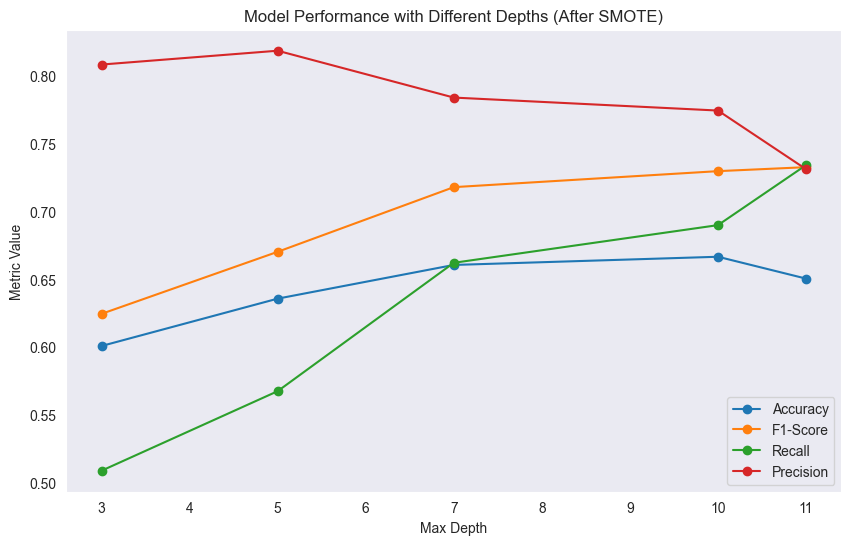


Summary Results:
   Depth  Accuracy  F1-Score    Recall  Precision
0    3.0  0.600806  0.624526  0.508754   0.808511
1    5.0  0.635753  0.670316  0.567456   0.818722
2    7.0  0.660618  0.718035  0.662204   0.784146
3   10.0  0.666667  0.729847  0.690010   0.774566
4    NaN  0.650538  0.732785  0.734295   0.731282


In [8]:
# Evaluate the main model (Depth=Unlimited)
evaluate_model(main_model, X_train_resampled, y_train_resampled, X_test, y_test, title="Main Model (Depth=Unlimited)")

# Test different depths
depths = [3, 5, 7, 10, None]
results = []

def evaluate_model_with_metrics(model, X_train, y_train, X_test, y_test, title=""):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    return accuracy, f1, recall, precision

for depth in depths:
    test_model = DecisionTreeClassifier(max_depth=depth, random_state=42)
    accuracy, f1, recall, precision = evaluate_model_with_metrics(test_model, X_train_resampled, y_train_resampled, X_test, y_test, title=f"Test Model (Depth={depth if depth else 'Unlimited'})")

    results.append({
        "Depth": depth if depth else "Unlimited",
        "Accuracy": accuracy,
        "F1-Score": f1,
        "Recall": recall,
        "Precision": precision
    })

# Results visualization
results_df = pd.DataFrame(results)
results_df["Depth"] = results_df["Depth"].replace("Unlimited", None).astype(float)

plt.figure(figsize=(10, 6))
plt.plot(results_df["Depth"].fillna(results_df["Depth"].max() + 1), results_df["Accuracy"], label="Accuracy", marker="o")
plt.plot(results_df["Depth"].fillna(results_df["Depth"].max() + 1), results_df["F1-Score"], label="F1-Score", marker="o")
plt.plot(results_df["Depth"].fillna(results_df["Depth"].max() + 1), results_df["Recall"], label="Recall", marker="o")
plt.plot(results_df["Depth"].fillna(results_df["Depth"].max() + 1), results_df["Precision"], label="Precision", marker="o")
plt.xlabel("Max Depth")
plt.ylabel("Metric Value")
plt.title("Model Performance with Different Depths (After SMOTE)")
plt.legend()
plt.grid()
plt.show()

# Display results as a table
print("\nSummary Results:")
print(results_df)


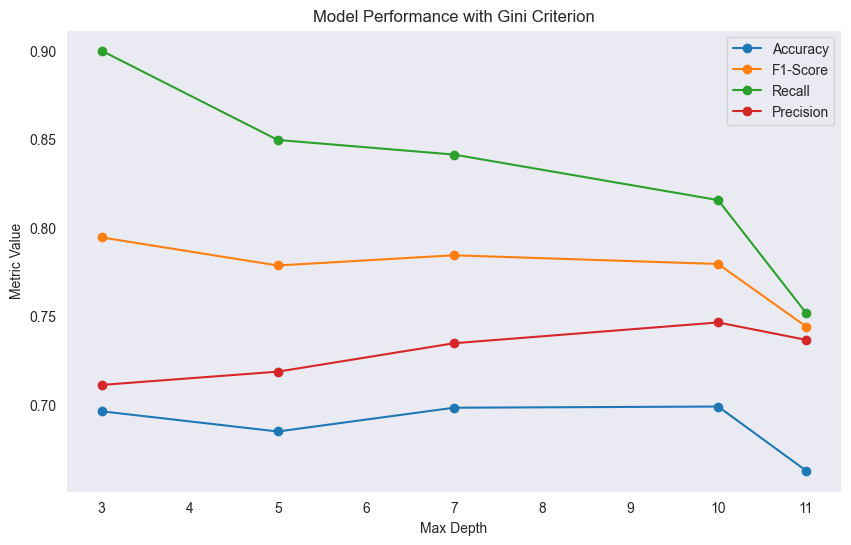

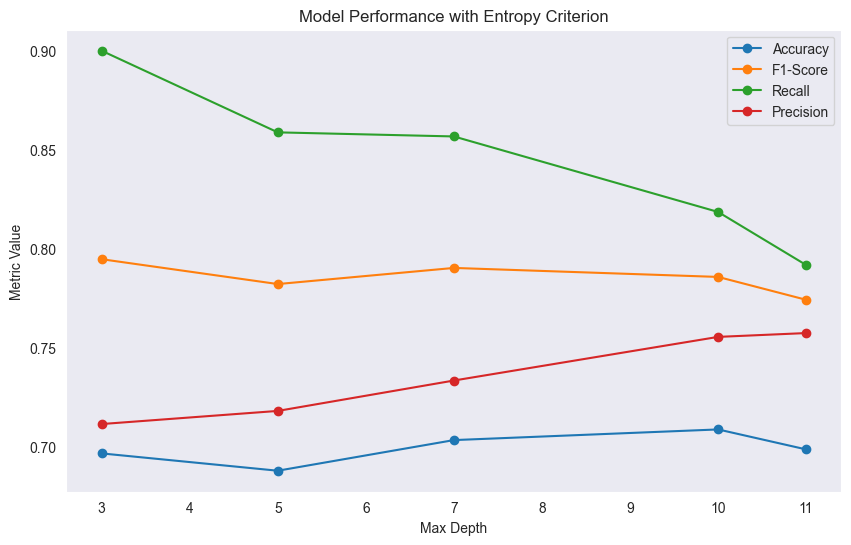


Summary Results:
  Criterion  Depth  Accuracy  F1-Score    Recall  Precision
0      Gini    3.0  0.696237  0.794545  0.900103   0.711147
1      Gini    5.0  0.684812  0.778669  0.849640   0.718641
2      Gini    7.0  0.698253  0.784446  0.841401   0.734712
3      Gini   10.0  0.698925  0.779528  0.815654   0.746466
4      Gini    NaN  0.662634  0.744139  0.751802   0.736630
5   Entropy    3.0  0.696909  0.794907  0.900103   0.711726
6   Entropy    5.0  0.688172  0.782364  0.858908   0.718346
7   Entropy    7.0  0.703629  0.790499  0.856849   0.733686
8   Entropy   10.0  0.709005  0.785961  0.818744   0.755703
9   Entropy    NaN  0.698925  0.774421  0.791967   0.757635


In [9]:
# Test different depths and criteria (Gini vs Entropy)
depths = [3, 5, 7, 10, None]
criteria = ['gini', 'entropy']
results = []

def evaluate_model_with_metrics(model, X_train, y_train, X_test, y_test, title=""):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    return accuracy, f1, recall, precision

for criterion in criteria:
    for depth in depths:
        # Create and evaluate the model
        test_model = DecisionTreeClassifier(max_depth=depth, criterion=criterion, random_state=42)
        accuracy, f1, recall, precision = evaluate_model_with_metrics(
            test_model,
            X_train,
            y_train,
            X_test,
            y_test,
            title=f"Test Model (Criterion={criterion.capitalize()}, Depth={depth if depth else 'Unlimited'})"
        )
        # Append the results
        results.append({
            "Criterion": criterion.capitalize(),
            "Depth": depth if depth else "Unlimited",
            "Accuracy": accuracy,
            "F1-Score": f1,
            "Recall": recall,
            "Precision": precision
        })

# Convert results to DataFrame
results_df = pd.DataFrame(results)
results_df["Depth"] = results_df["Depth"].replace("Unlimited", None).astype(float)

# Visualize the results
for criterion in criteria:
    subset = results_df[results_df["Criterion"] == criterion.capitalize()]
    plt.figure(figsize=(10, 6))
    plt.plot(
        subset["Depth"].fillna(subset["Depth"].max() + 1),
        subset["Accuracy"],
        label="Accuracy",
        marker="o"
    )
    plt.plot(
        subset["Depth"].fillna(subset["Depth"].max() + 1),
        subset["F1-Score"],
        label="F1-Score",
        marker="o"
    )
    plt.plot(
        subset["Depth"].fillna(subset["Depth"].max() + 1),
        subset["Recall"],
        label="Recall",
        marker="o"
    )
    plt.plot(
        subset["Depth"].fillna(subset["Depth"].max() + 1),
        subset["Precision"],
        label="Precision",
        marker="o"
    )
    plt.xlabel("Max Depth")
    plt.ylabel("Metric Value")
    plt.title(f"Model Performance with {criterion.capitalize()} Criterion")
    plt.legend()
    plt.grid()
    plt.show()

# Display the results as a table
print("\nSummary Results:")
print(results_df)

Updated Model Parameters: {'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': 5, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'random_state': 42, 'splitter': 'best'}


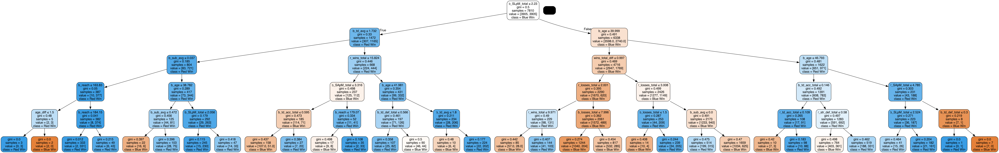

In [10]:
# Set the optimal depth for the main model
main_model.set_params(max_depth=5)

# Train the main model on balanced data (after applying SMOTE)
main_model.fit(X_train_resampled, y_train_resampled)

# Visualize the decision tree
dot_data = export_graphviz(
    main_model,
    out_file=None,
    feature_names=features,
    class_names=['Blue Win', 'Red Win'],
    filled=True,
    rounded=True,
    special_characters=True
)

# Generate the tree graph
graph = pydotplus.graph_from_dot_data(dot_data)

# Create a directory to store the tree image, if it doesn't already exist
output_dir = 'output_tree_images'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Save the tree image to the specified directory
output_path = os.path.join(output_dir, "decision_tree_max_depth_5_smote.png")
graph.write_png(output_path)

# Confirm the model's parameters (for verification)
print("Updated Model Parameters:", main_model.get_params())

# Display the tree directly in Jupyter Notebook
Image(graph.create_png())


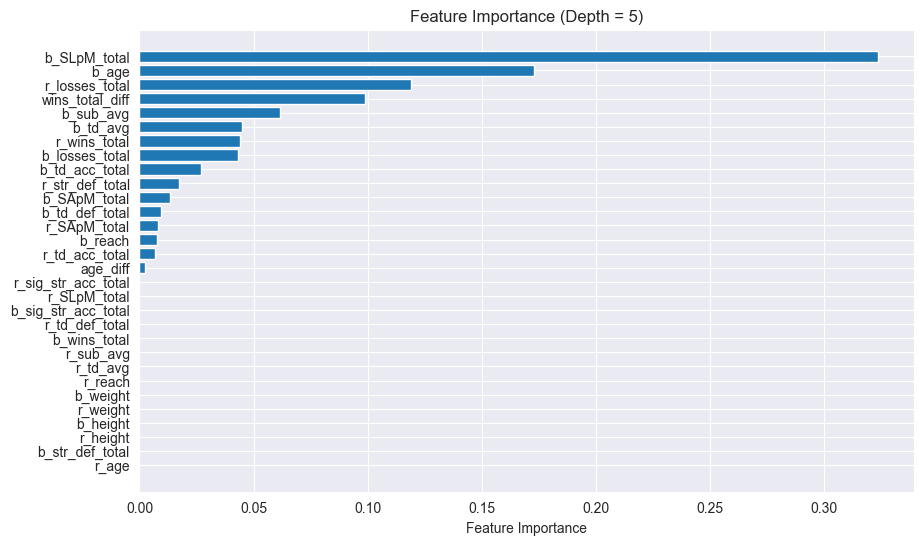

In [11]:
# Get feature importances
feature_importances = main_model.feature_importances_

# Sort features by importance
sorted_indices = feature_importances.argsort()[::-1]
sorted_features = [features[i] for i in sorted_indices]

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(sorted_features, feature_importances[sorted_indices])
plt.xlabel('Feature Importance')
plt.title('Feature Importance (Depth = 5)')
plt.gca().invert_yaxis()
plt.show()


In [12]:
from sklearn.model_selection import cross_val_score, cross_validate

# Perform 10-fold cross-validation for F1-Score
cv_scores = cross_val_score(main_model, X, y, cv=10, scoring='f1')

# Output the results for F1-Score
print("Cross-Validation F1-Score (mean):", cv_scores.mean())
print("Cross-Validation F1-Score (all folds):", cv_scores)

# Perform 10-fold cross-validation for multiple metrics
scoring = ['accuracy', 'precision', 'recall', 'f1']
cv_results = cross_validate(main_model, X, y, cv=10, scoring=scoring, return_train_score=False)

# Output the results for all metrics
for metric in scoring:
    mean_score = cv_results[f'test_{metric}'].mean()
    std_score = cv_results[f'test_{metric}'].std()
    print(f"\nCross-Validation {metric.capitalize()} (mean): {mean_score:.2f} (\u00B1 {std_score:.2f})")


Cross-Validation F1-Score (mean): 0.7695894167395428
Cross-Validation F1-Score (all folds): [0.78053625 0.69615832 0.72421053 0.74650699 0.77818182 0.80213904
 0.79963235 0.78691424 0.79528986 0.78632479]

Cross-Validation Accuracy (mean): 0.68 (± 0.02)

Cross-Validation Precision (mean): 0.72 (± 0.04)

Cross-Validation Recall (mean): 0.83 (± 0.10)

Cross-Validation F1 (mean): 0.77 (± 0.03)


The model is fitted and ready for evaluation.

=== Metrics on Training Data ===
              precision    recall  f1-score   support

   Blue Wins       0.49      0.78      0.60      2046
    Red Wins       0.83      0.58      0.69      3905

    accuracy                           0.65      5951
   macro avg       0.66      0.68      0.65      5951
weighted avg       0.72      0.65      0.66      5951


=== Metrics on Test Data ===
              precision    recall  f1-score   support

   Blue Wins       0.48      0.76      0.59       517
    Red Wins       0.82      0.57      0.67       971

    accuracy                           0.64      1488
   macro avg       0.65      0.67      0.63      1488
weighted avg       0.70      0.64      0.64      1488


=== Final Model Metrics on Test Data ===
Accuracy: 0.64
Precision: 0.82
Recall: 0.57
F1-Score: 0.67


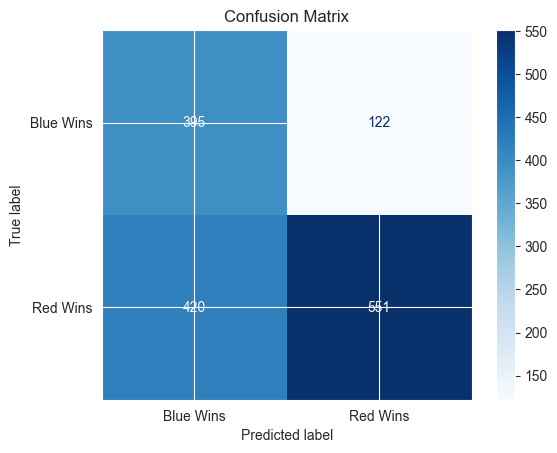


Feature Importances:
b_SLpM_total           0.323467
b_age                  0.172731
r_losses_total         0.118851
wins_total_diff        0.099030
b_sub_avg              0.061488
b_td_avg               0.045065
r_wins_total           0.043939
b_losses_total         0.043254
b_td_acc_total         0.026935
r_str_def_total        0.017237
b_SApM_total           0.013577
b_td_def_total         0.009474
r_SApM_total           0.008032
b_reach                0.007844
r_td_acc_total         0.006627
age_diff               0.002451
r_sig_str_acc_total    0.000000
b_sig_str_acc_total    0.000000
r_SLpM_total           0.000000
b_wins_total           0.000000
r_td_def_total         0.000000
r_reach                0.000000
r_sub_avg              0.000000
b_weight               0.000000
r_td_avg               0.000000
r_weight               0.000000
b_height               0.000000
b_str_def_total        0.000000
r_height               0.000000
r_age                  0.000000
dtype: float64


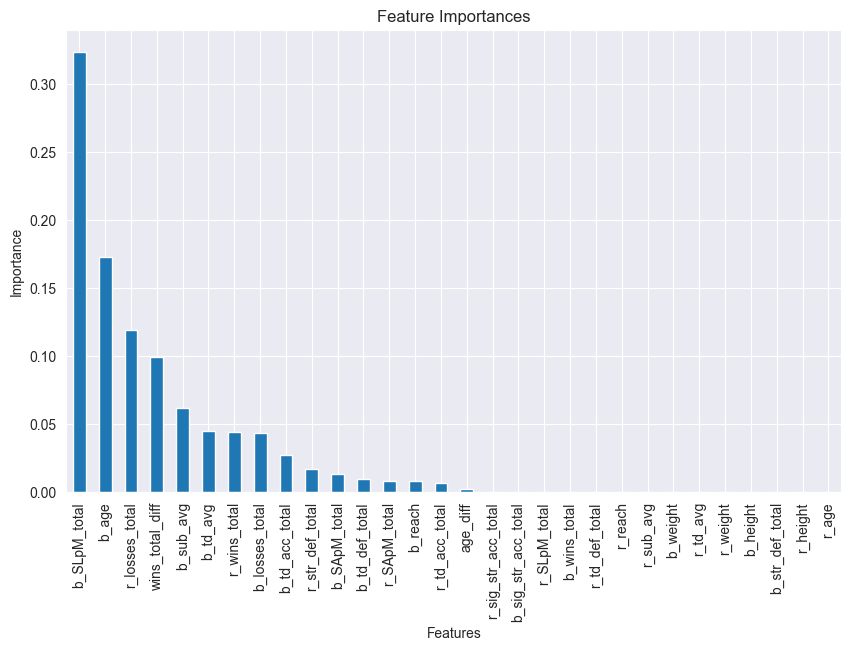

In [13]:
# Check if the model is fitted
try:
    check_is_fitted(main_model)
    print("The model is fitted and ready for evaluation.")
except:
    print("The model is not fitted yet. Please train the model first.")
    raise

# Metrics on training data
y_train_pred = main_model.predict(X_train)
print("\n=== Metrics on Training Data ===")
print(classification_report(y_train, y_train_pred, target_names=["Blue Wins", "Red Wins"]))

# Metrics on test data
y_test_pred = main_model.predict(X_test)
print("\n=== Metrics on Test Data ===")
print(classification_report(y_test, y_test_pred, target_names=["Blue Wins", "Red Wins"]))

# Accuracy, Precision, Recall, and F1-Score for test data
test_accuracy = accuracy_score(y_test, y_test_pred)
test_precision = precision_score(y_test, y_test_pred)
test_recall = recall_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)

print("\n=== Final Model Metrics on Test Data ===")
print(f"Accuracy: {test_accuracy:.2f}")
print(f"Precision: {test_precision:.2f}")
print(f"Recall: {test_recall:.2f}")
print(f"F1-Score: {test_f1:.2f}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=["Blue Wins", "Red Wins"])
disp.plot(cmap="Blues")
plt.title("Confusion Matrix")
plt.show()

# Feature importances
feature_importances = pd.Series(main_model.feature_importances_, index=X.columns)
print("\nFeature Importances:")
print(feature_importances.sort_values(ascending=False))

# Visualize feature importances
feature_importances.sort_values(ascending=False).plot(kind='bar', figsize=(10, 6), title='Feature Importances')
plt.xlabel("Features")
plt.ylabel("Importance")
plt.show()

# # Final metrics summary
# print("\n=== Final Metrics Summary ===")
# print(f"Training Accuracy: {accuracy_score(y_train, y_train_pred):.2f}")
# print(f"Test Accuracy: {test_accuracy:.2f}")
# print(f"Test Precision: {test_precision:.2f}")
# print(f"Test Recall: {test_recall:.2f}")
# print(f"Test F1-Score: {test_f1:.2f}")


The model is fitted and ready for evaluation.


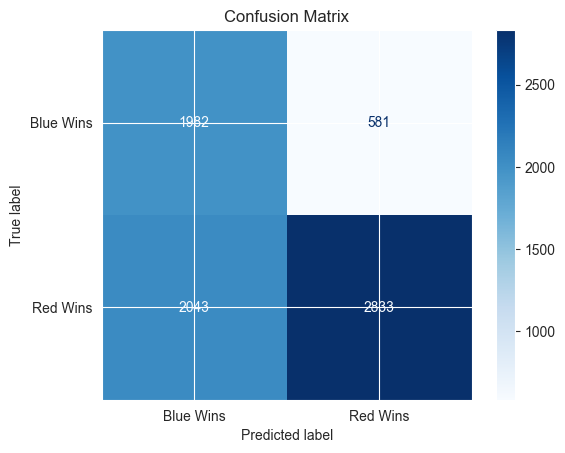


Feature Importances:
b_SLpM_total           0.323467
b_age                  0.172731
r_losses_total         0.118851
wins_total_diff        0.099030
b_sub_avg              0.061488
b_td_avg               0.045065
r_wins_total           0.043939
b_losses_total         0.043254
b_td_acc_total         0.026935
r_str_def_total        0.017237
b_SApM_total           0.013577
b_td_def_total         0.009474
r_SApM_total           0.008032
b_reach                0.007844
r_td_acc_total         0.006627
age_diff               0.002451
r_sig_str_acc_total    0.000000
b_sig_str_acc_total    0.000000
r_SLpM_total           0.000000
b_wins_total           0.000000
r_td_def_total         0.000000
r_reach                0.000000
r_sub_avg              0.000000
b_weight               0.000000
r_td_avg               0.000000
r_weight               0.000000
b_height               0.000000
b_str_def_total        0.000000
r_height               0.000000
r_age                  0.000000
dtype: float64


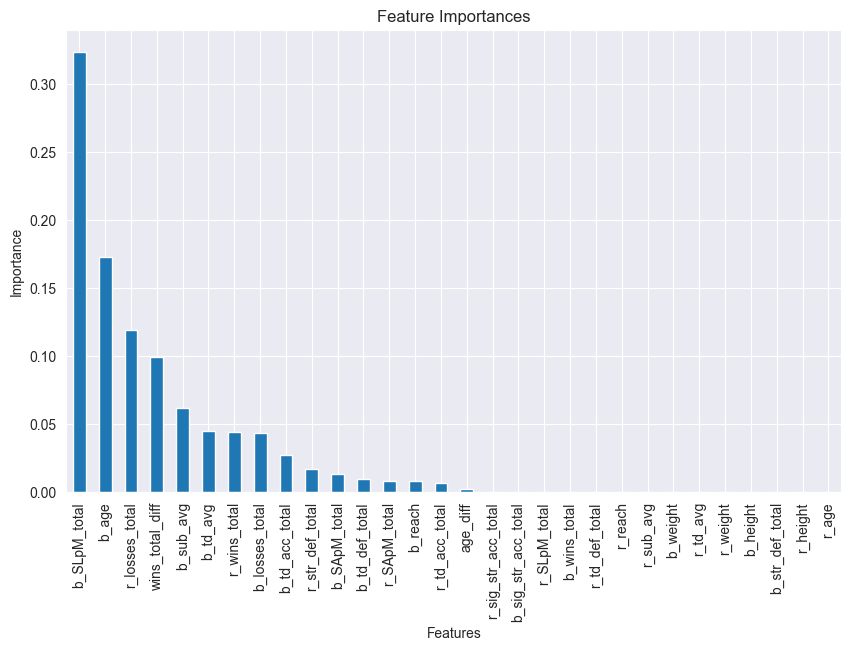

In [14]:
# Check if the model is fitted
try:
    check_is_fitted(main_model)
    print("The model is fitted and ready for evaluation.")
except:
    print("The model is not fitted yet. Please train the model first.")
    raise


# Predicted percentages
predicted_counts = pd.Series(y_test_pred).value_counts()
predicted_percentages = (predicted_counts / len(y_test_pred)) * 100

# Predictions for training and test sets
y_train_pred = main_model.predict(X_train)
y_test_pred = main_model.predict(X_test)
y_pred = main_model.predict(X)

# Metrics for training set
train_accuracy = accuracy_score(y_train, y_train_pred)
train_precision = precision_score(y_train, y_train_pred)
train_recall = recall_score(y_train, y_train_pred)
train_f1 = f1_score(y_train, y_train_pred)

# Metrics for test set
test_accuracy = accuracy_score(y_test, y_test_pred)
test_precision = precision_score(y_test, y_test_pred)
test_recall = recall_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)

# Overall metrics
overall_accuracy = accuracy_score(y, y_pred)
overall_precision = precision_score(y, y_pred)
overall_recall = recall_score(y, y_pred)
overall_f1 = f1_score(y, y_pred)

# Display metrics
metrics = {
    "Metric": ["Accuracy", "Precision", "Recall", "F1-Score"],
    "Training": [train_accuracy, train_precision, train_recall, train_f1],
    "Testing": [test_accuracy, test_precision, test_recall, test_f1],
    "Overall": [overall_accuracy, overall_precision, overall_recall, overall_f1]
}


# Confusion matrix
conf_matrix = confusion_matrix(y, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=["Blue Wins", "Red Wins"])
disp.plot(cmap="Blues")
plt.title("Confusion Matrix")
plt.show()

# Feature importances
feature_importances = pd.Series(main_model.feature_importances_, index=X.columns)
print("\nFeature Importances:")
print(feature_importances.sort_values(ascending=False))

# Visualize feature importances
feature_importances.sort_values(ascending=False).plot(kind='bar', figsize=(10, 6), title='Feature Importances')
plt.xlabel("Features")
plt.ylabel("Importance")
plt.show()

In [15]:
print("\n=== Predicted Class Distribution ===")
print(f"Blue Wins: {predicted_percentages[0]:.2f}%")
print(f"Red Wins: {predicted_percentages[1]:.2f}%")

metrics_df = pd.DataFrame(metrics)
print("\n=== Model Metrics ===")
print(metrics_df)



=== Predicted Class Distribution ===
Blue Wins: 54.77%
Red Wins: 45.23%

=== Model Metrics ===
      Metric  Training   Testing   Overall
0   Accuracy  0.650143  0.635753  0.647264
1  Precision  0.832543  0.818722  0.829818
2     Recall  0.584379  0.567456  0.581009
3   F1-Score  0.686729  0.670316  0.683474


In [16]:
# Save the main model
import joblib

# Ensure the main model is trained
# joblib.dump(main_model, "../models/sportynetai_7_depth_decision_tree_v1.pkl")
joblib.dump(main_model, "../models/sportinetai_depth_5_decision_tree_v1.pkl")
print("Main model saved as 'main_decision.pkl'")


Main model saved as 'main_decision.pkl'


In [17]:

# metadata = {
#     "features": features,  
#     "imputer": imputer     
# }
# joblib.dump(metadata, "../models/sportinetai_metadata.pkl")